# Linear Regression 

## Final Model 

In [275]:
lasso.score(X_train, y_train) 

0.8815814113277012

In [276]:
# test data R-square
lasso.score(X_test, y_test)

0.8888935706414623

In [277]:
# RMSE 
mean_squared_error(y_test, pred4, squared=False)

0.13789793036646456

In [278]:
# MAE 
mean_absolute_error(y_test, pred4)

0.10252337921026719

# Table of Contents 
### Data
    - 1. Data Load 
    - 2. Data Describe 
### Feature Selection 
    - 1. Continuous Variables 
    - 2. Categorical Variables
    - 3. Final DataFrame
### Feature Engineering 
    - 1. Imputate Missing Values 
    - 2. Outlier Check 
    - 3. VIF Check 
    - 4. One-hot Encoding 
    - 5. Final Dataset 
### Modeling 
    - 1. Basic Linear Regression Model 
    - 2. Backward Elimination Model
    - 3. Ridge Regression Model
    - 4. Lasso Regression Model 
### Conclusion

### 분석 start! 

In [2]:
import warnings
warnings.filterwarnings(action='ignore')

import pandas as pd
import numpy as np

from IPython.display import display
pd.options.display.max_rows = 999
pd.options.display.max_columns = 999
pd.set_option('display.max_info_columns', 500)

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn')
plt.rc('font', family='AppleGothic')
plt.rc('axes', unicode_minus=False)

# Data 
* y (target) : **SalePrice** 

## 1. Data Load

In [4]:
ames = pd.read_csv("Ames.csv")
ames.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
ames.drop("Id", axis=1, inplace=True) # index값 제거 

In [6]:
ames.shape

(1460, 80)

## 2. Data Describe 

### 1) Data Type 체크 

In [7]:
ames.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

### 2) missing data 

In [8]:
# 결측값이 있는 변수가 많아보이므로, 결측치 비율을 체크해 보았습니다. 

ames_na = (ames.isnull().sum() / len(ames)) * 100  # 결측값 비율에 대한 dataframe 
ames_na = ames_na.drop(ames_na[ames_na == 0].index).sort_values(ascending=False)

missing_data = pd.DataFrame({'Missing Ratio' : ames_na})
missing_data.head(20)

,Missing Ratio
PoolQC,99.520548
MiscFeature,96.301370
Alley,93.767123
Fence,80.753425
FireplaceQu,47.260274
LotFrontage,17.739726
GarageYrBlt,5.547945
GarageType,5.547945
GarageFinish,5.547945
GarageQual,5.547945


Text(0.5, 1.0, 'Percent missing data by feature')

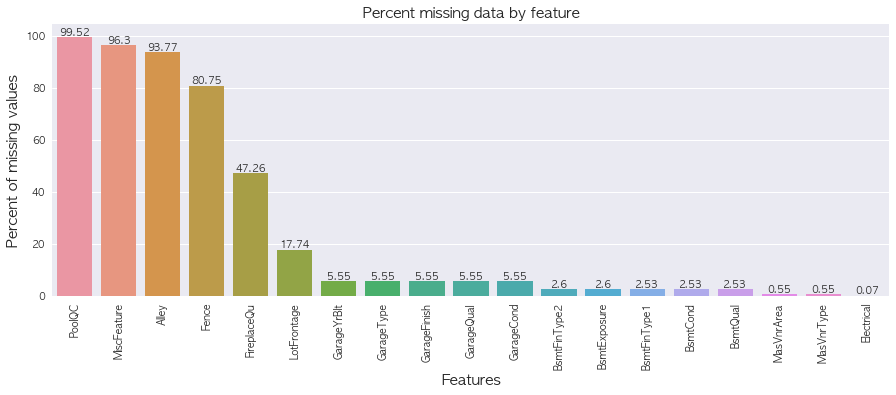

In [18]:
f, ax = plt.subplots(figsize=(15, 5))
plot = sns.barplot(x=ames_na.index, y=round(ames_na, 2))

for p in plot.patches:
    plot.annotate(p.get_height(), 
                        (p.get_x() + p.get_width() / 2.0, 
                         p.get_height()), 
                        ha = 'center', 
                        va = 'center', 
                        xytext = (0, 5),
                        textcoords = 'offset points')
    
plt.xticks(rotation='90')    
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of missing values', fontsize=15)
plt.title('Percent missing data by feature', fontsize=15)

* PoolQC, MscFeature, Alley, Fence 같은 경우 결측치가 데이터의 대부분을 차지하고 있는 것을 볼 수 있습니다. 
* 위와 같은 변수들은 (일단은) drop 하는 것이 좋아보이고, 다른 변수들의 경우 채워줘서 비교하는 과정이 필요해 보입니다. 

### 3) Target Distribution 

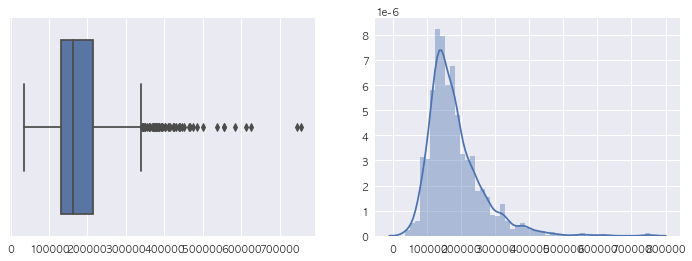

In [10]:
# target distribution 
figure, (ax1, ax2) = plt.subplots(ncols=2)
figure.set_size_inches(12,4)

sns.boxplot(ames[["SalePrice"]], ax=ax1)
sns.distplot(ames[["SalePrice"]], ax=ax2)

* boxplot과 distplot을 살펴 보았을 때, 왼쪽으로 살짝 치우쳐져 있음을 볼 수 있습니다. 
* 반응변수가 정규분포 형태를 보이지 않으면, 회귀 모형이 등분산성을 만족하지 않는 문제가 발생할 수 있습니다. 

.    



따라서, 

1. 왼쪽 두개의 점을 outlier라고 생각하고 제거하여 분포를 살펴보고, 
2. log transformation을 통해 정규분포의 형태에 더욱 가까워지는지 판단해 보았습니다. 

In [11]:
# 1) 2개의 Outlier 
ames.sort_values("SalePrice", ascending=False).head(2)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
691,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,6,1994,1995,Gable,WdShngl,HdBoard,HdBoard,BrkFace,1170.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,1455,Unf,0,989,2444,GasA,Ex,Y,SBrkr,2444,1872,0,4316,0,1,3,1,4,1,Ex,10,Typ,2,Ex,Attchd,1994.0,Fin,3,832,TA,TA,Y,382,50,0,0,0,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000
1182,60,RL,160.0,15623,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,5,1996,1996,Hip,CompShg,Wd Sdng,ImStucc,None,0.0,Gd,TA,PConc,Ex,TA,Av,GLQ,2096,Unf,0,300,2396,GasA,Ex,Y,SBrkr,2411,2065,0,4476,1,0,3,1,4,1,Ex,10,Typ,2,TA,Attchd,1996.0,Fin,3,813,TA,TA,Y,171,78,0,0,0,555,Ex,MnPrv,NaN,0,7,2007,WD,Abnorml,745000


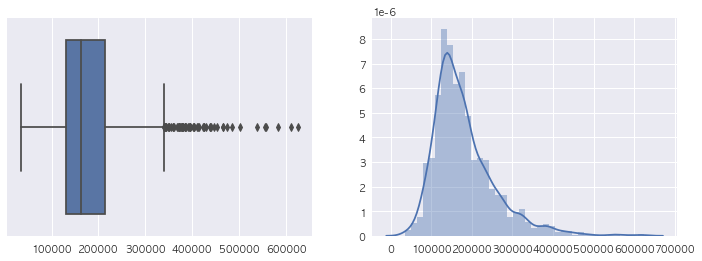

In [12]:
# 1) 2개의 Outlier를 제거한 target distribution 
figure, (ax1, ax2) = plt.subplots(ncols=2)
figure.set_size_inches(12,4)

sns.boxplot(ames[ames[["SalePrice"]] < 745000], ax=ax1)
sns.distplot(ames[ames[["SalePrice"]] < 745000], ax=ax2)

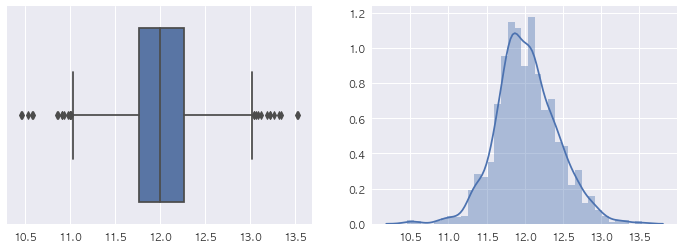

In [13]:
# 2) log transformation을 취한 target distribution 
figure, (ax1, ax2) = plt.subplots(ncols=2)
figure.set_size_inches(12,4)

sns.boxplot(np.log1p(ames[["SalePrice"]]), ax=ax1)
sns.distplot(np.log1p(ames[["SalePrice"]]), ax=ax2)

* 반응변수에 log transformation을 취한 값이 정규분포의 형태에 더욱 가까운 것을 볼 수 있습니다. 
* 따라서 반응변수인 SalePrice에 **로그변환**을 취한 값을 y값으로 사용하겠습니다. 

In [14]:
ames[['log_SalePrice']] = np.log1p(ames[["SalePrice"]])

# Feature Selection 

## 1. Continuous Variables 

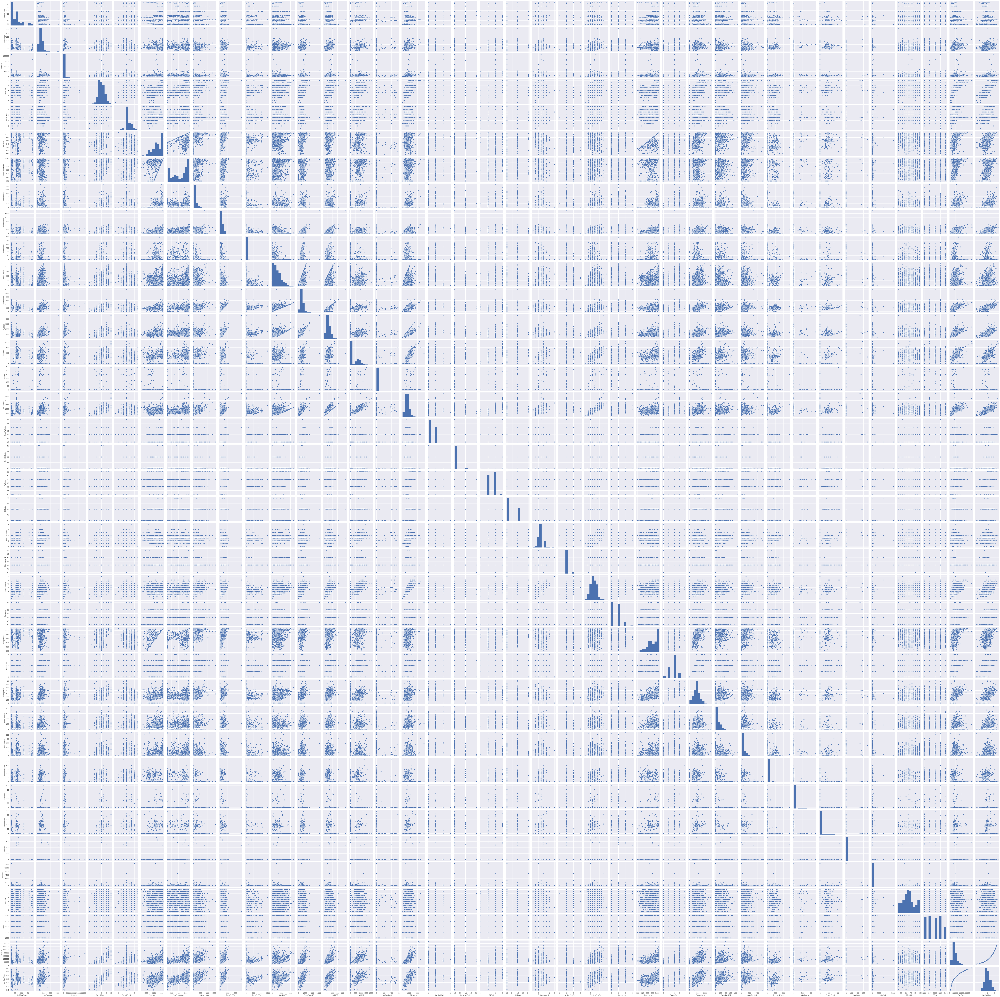

In [25]:
# 연속형 변수들과 target 변수 사이의 pairplot 
sns.pairplot(ames) 
plt.show()

* 조금 많아서 제대로 보기 힘들지만, **가장 마지막 줄**의 pairplot을 살펴보면, log_SalePrice와 다른 변수들 사이에 **선형관계**가 존재하는지 파악할 수 있습니다. 
* 0 값이 대부분이어서 반응변수와 선형 관계를 보이지 않는 변수들이 몇 개 보입니다. 이러한 변수들은 회귀분석의 과정에서 유의미하지 않은 변수라고 생각됩니다. 
* categorical한 변수이지만 연속형으로 표시되어 있는 변수들이 있는지 체크해 보고, 이러한 경우 형 변환이 필요해 보입니다. 

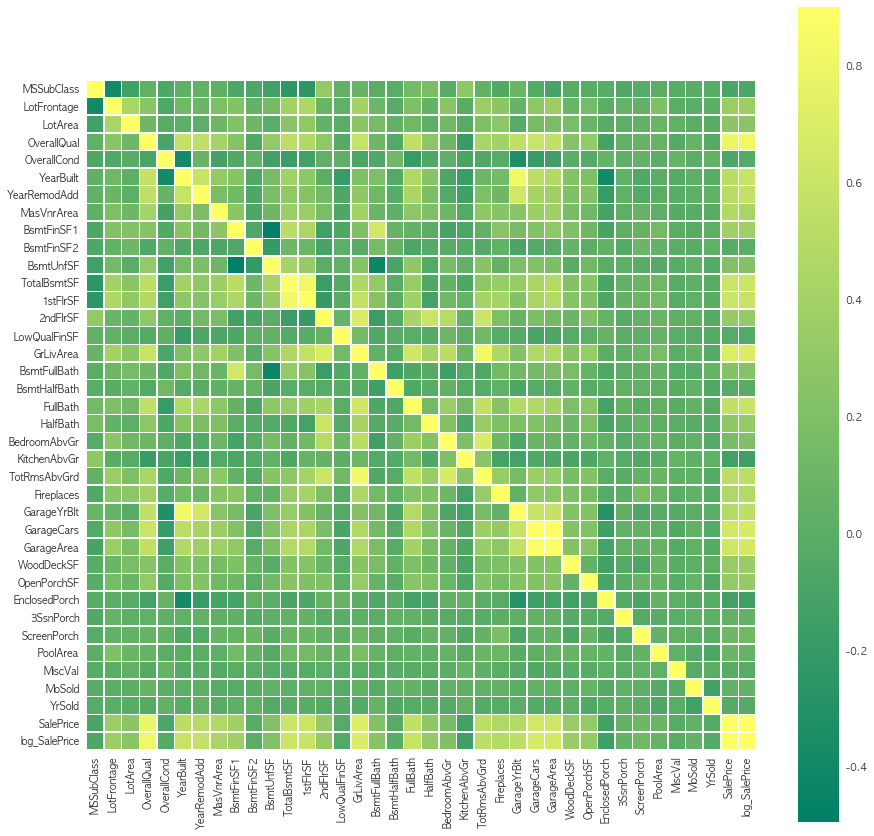

In [15]:
# Correlation
plt.subplots(figsize=(15,15))
sns.heatmap(ames.corr(), vmax=0.9, linewidths=.5, cmap='summer', square=True)

In [16]:
ames.corr()['log_SalePrice'].sort_values(ascending=False)[:20]

log_SalePrice    1.000000
SalePrice        0.948374
OverallQual      0.817185
GrLivArea        0.700927
GarageCars       0.680625
GarageArea       0.650888
TotalBsmtSF      0.612134
1stFlrSF         0.596981
FullBath         0.594771
YearBuilt        0.586570
YearRemodAdd     0.565608
GarageYrBlt      0.541073
TotRmsAbvGrd     0.534422
Fireplaces       0.489450
MasVnrArea       0.430809
BsmtFinSF1       0.372023
LotFrontage      0.355879
WoodDeckSF       0.334135
OpenPorchSF      0.321053
2ndFlrSF         0.319300
Name: log_SalePrice, dtype: float64

* 반응변수인 log_SalePrice와 상관관계가 높고, 선형성을 띄는 설명변수들을 채택하였습니다. 
* **OverallQual, GrLivArea, GarageCars, GarageArea, TotalBsmtSF, 1stFlrSF, FullBath, YearBuilt, YearRemodAdd, TotRmsAbvGrd, MasVnrArea, LotFrontage** 변수를 선택했습니다.

## 2. Categorical Variables

* 변수의 이름을 보고, SalePrice에 유의미한 영향을 줄 것 같은 변수들을 선택해 보았습니다. 
* log_SalePrice와 해당 변수 사이의 boxplot을 그려서, log_SalePrice에 영향을 미치는 변수인지 파악해 보았습니다. 
* 변수의 범주에 따른 boxplot의 상자들의 크기, 중앙값의 위치를 살펴보고, 범주마다 달라지는 양상을 보이면 가격에 영향을 미치는 변수라고 파악했습니다. 

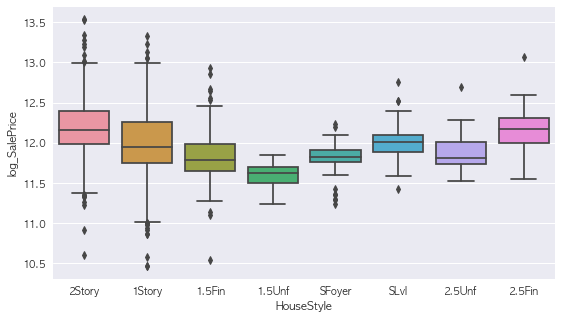

In [20]:
# House Style vs SalePrice 
plt.figure(figsize=(9, 5))
sns.boxplot(x='HouseStyle', y='log_SalePrice', data=ames)

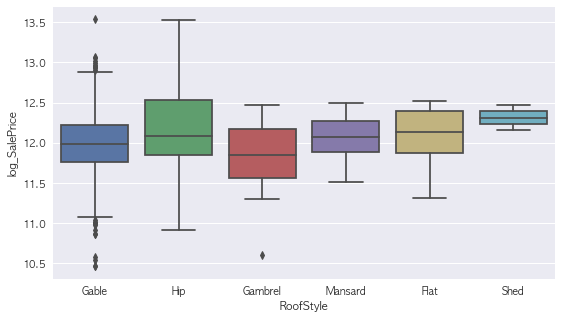

In [21]:
# RoofStyle vs SalePrice 
plt.figure(figsize=(9, 5))
sns.boxplot(x='RoofStyle', y='log_SalePrice', data=ames)

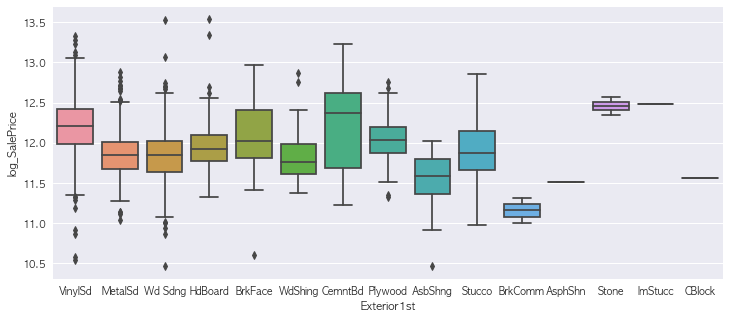

In [27]:
# Exterior1st vs SalePrice 
plt.figure(figsize=(12, 5))
sns.boxplot(x='Exterior1st', y='log_SalePrice', data=ames)

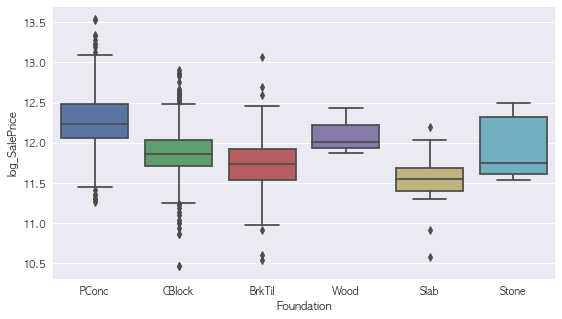

In [23]:
# Foundation vs SalePrice 
plt.figure(figsize=(9, 5))
sns.boxplot(x='Foundation', y='log_SalePrice', data=ames)

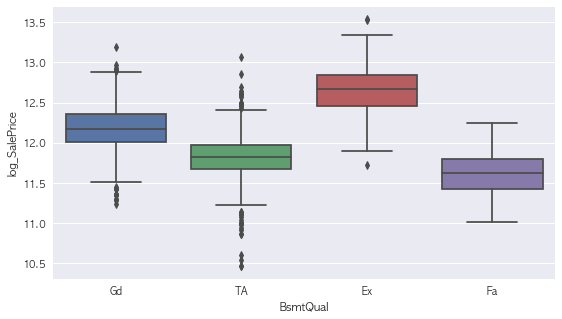

In [24]:
# BsmtQual vs SalePrice 
plt.figure(figsize=(9, 5))
sns.boxplot(x='BsmtQual', y='log_SalePrice', data=ames)

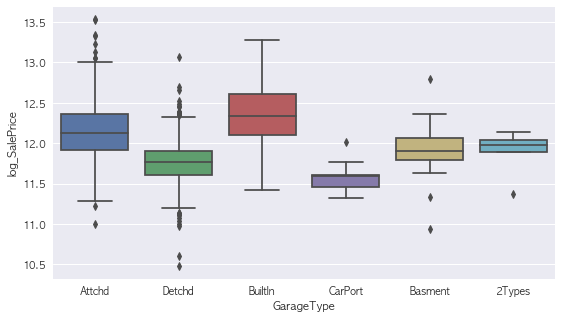

In [25]:
# GarageType vs SalePrice 
plt.figure(figsize=(9, 5))
sns.boxplot(x='GarageType', y='log_SalePrice', data=ames)

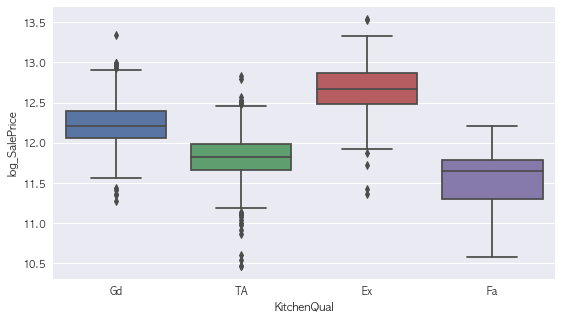

In [26]:
# KitchenQual vs SalePrice 
plt.figure(figsize=(9, 5))
sns.boxplot(x='KitchenQual', y='log_SalePrice', data=ames)

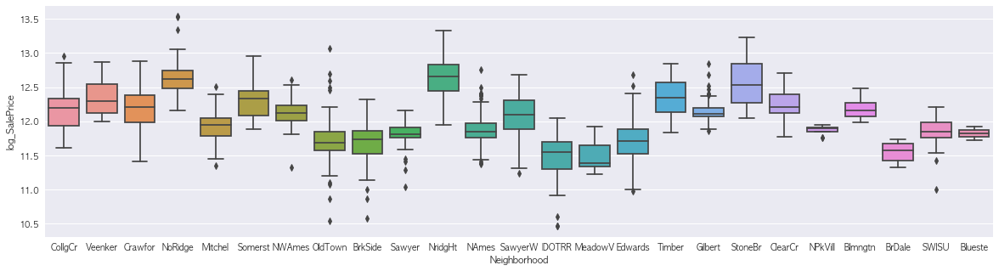

In [48]:
# Neighborhood vs SalePrice 
plt.figure(figsize=(20, 5))
sns.boxplot(x='Neighborhood', y='log_SalePrice', data=ames)

* **HouseStyle, RoofStyle, Exterior1st, Foundation, BsmtQual, GarageType, KitchenQual, Neighborhood** 변수를 선택하였습니다. 

## 3. Final DataFrame 

In [82]:
# 새로 선택한 변수들로 구성된 dataset 
ames2 = ames[['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', 
              '1stFlrSF', 'FullBath', 'YearBuilt', 'YearRemodAdd',  
              'TotRmsAbvGrd', 'MasVnrArea', 'LotFrontage', 
              'HouseStyle', 'RoofStyle', 'Exterior1st', 'Foundation', 'BsmtQual', 'GarageType', 'KitchenQual', 'Neighborhood', 
              'log_SalePrice']]

In [83]:
ames2.shape

(1460, 21)

In [84]:
ames2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   OverallQual    1460 non-null   int64  
 1   GrLivArea      1460 non-null   int64  
 2   GarageCars     1460 non-null   int64  
 3   GarageArea     1460 non-null   int64  
 4   TotalBsmtSF    1460 non-null   int64  
 5   1stFlrSF       1460 non-null   int64  
 6   FullBath       1460 non-null   int64  
 7   YearBuilt      1460 non-null   int64  
 8   YearRemodAdd   1460 non-null   int64  
 9   TotRmsAbvGrd   1460 non-null   int64  
 10  MasVnrArea     1452 non-null   float64
 11  LotFrontage    1201 non-null   float64
 12  HouseStyle     1460 non-null   object 
 13  RoofStyle      1460 non-null   object 
 14  Exterior1st    1460 non-null   object 
 15  Foundation     1460 non-null   object 
 16  BsmtQual       1423 non-null   object 
 17  GarageType     1379 non-null   object 
 18  KitchenQ

# Feature Engineering 

* 새로 선택한 feature들로 구성된 데이터입니다. 
* 선형회귀분석에 적용할 수 있는 데이터셋으로 구성하는 과정을 거쳤습니다. 

## 1. Imputate Missing Values  

In [85]:
# 결측값 확인 
ames2.isnull().sum()

OverallQual        0
GrLivArea          0
GarageCars         0
GarageArea         0
TotalBsmtSF        0
1stFlrSF           0
FullBath           0
YearBuilt          0
YearRemodAdd       0
TotRmsAbvGrd       0
MasVnrArea         8
LotFrontage      259
HouseStyle         0
RoofStyle          0
Exterior1st        0
Foundation         0
BsmtQual          37
GarageType        81
KitchenQual        0
Neighborhood       0
log_SalePrice      0
dtype: int64

### 1) GarageYrBlt, GarageType

In [86]:
ames["GarageCars"].value_counts()

2    824
1    369
3    181
0     81
4      5
Name: GarageCars, dtype: int64

In [87]:
# GarageType의 결측값의 개수는 81개인데, 이는 GarageCars = 0 의 의미와 동일하므로, 0으로 결측값을 채워줍니다. 
ames2["GarageType"] = ames2["GarageType"].fillna(0)

### 2) LotFrontage

In [88]:
ames["Neighborhood"].value_counts()

NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

In [89]:
# LotFrontage : 동일한 Neighborhood의 중앙값으로 채워줍니다. 
ames2["LotFrontage"] = ames2.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))

### 3) BsmtQual

In [90]:
# BsmtQual : Categorical 변수로, 결측값의 의미는 지하실이 없다는 의미로 해석할 수 있으므로, "None" 이라는 값으로 채워줍니다. 
ames2['BsmtQual'] = ames2['BsmtQual'].fillna("None")

### 4) MasVnrArea

In [92]:
# MasVnrArea : 결측값의 의미는 vnr이 없다는 의미로 해석할 수 있으므로, 0 값으로 채워줍니다. 
ames2['MasVnrArea'] = ames2['MasVnrArea'].fillna(0)

### 결측값을 다 채운, 최종 dataset 

In [93]:
ames2.isnull().sum()

OverallQual      0
GrLivArea        0
GarageCars       0
GarageArea       0
TotalBsmtSF      0
1stFlrSF         0
FullBath         0
YearBuilt        0
YearRemodAdd     0
TotRmsAbvGrd     0
MasVnrArea       0
LotFrontage      0
HouseStyle       0
RoofStyle        0
Exterior1st      0
Foundation       0
BsmtQual         0
GarageType       0
KitchenQual      0
Neighborhood     0
log_SalePrice    0
dtype: int64

In [94]:
ames2.shape

(1460, 21)

## 2. Outlier Check 

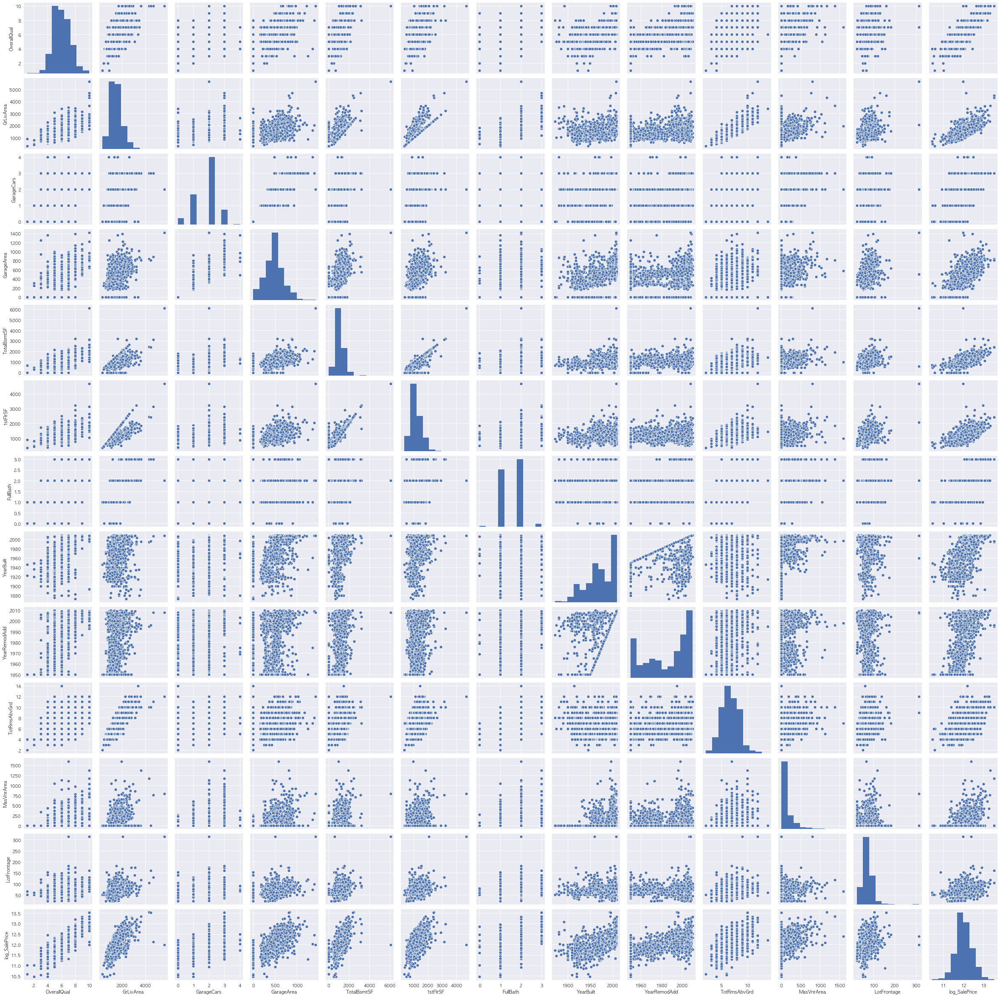

In [71]:
sns.pairplot(ames2)

* GrLivArea, TotalBsmtSF, 1stFlrSF, LotFrontage 변수를 살펴보면, 하나 혹은 두개의 점이 크게 튀고 있음을 볼 수 있습니다. 
* 이러한 점을 이상점이라고 볼 수 있는지 체크해 보는 과정을 거쳤습니다. 

In [95]:
# GrLivArea Outlier
ames2.sort_values("GrLivArea", ascending=False).head(2)

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,YearBuilt,YearRemodAdd,TotRmsAbvGrd,MasVnrArea,LotFrontage,HouseStyle,RoofStyle,Exterior1st,Foundation,BsmtQual,GarageType,KitchenQual,Neighborhood,log_SalePrice
1298,10,5642,2,1418,6110,4692,2,2008,2008,12,796.0,313.0,2Story,Hip,Stucco,PConc,Ex,Attchd,Ex,Edwards,11.982935
523,10,4676,3,884,3138,3138,3,2007,2008,11,762.0,130.0,2Story,Hip,CemntBd,PConc,Ex,BuiltIn,Ex,Edwards,12.126764


In [73]:
# TotalBsmtSF Outlier
ames2.sort_values("TotalBsmtSF", ascending=False).head(1)

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,YearBuilt,YearRemodAdd,TotRmsAbvGrd,MasVnrArea,LotFrontage,HouseStyle,RoofStyle,Exterior1st,Foundation,BsmtQual,GarageType,KitchenQual,Neighborhood,log_SalePrice
1298,10,5642,2,1418,6110,4692,2,2008,2008,12,796.0,313.0,2Story,Hip,Stucco,PConc,Ex,Attchd,Ex,Edwards,11.982935


In [74]:
# 1stFlrSF Outlier
ames2.sort_values("1stFlrSF", ascending=False).head(1)

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,YearBuilt,YearRemodAdd,TotRmsAbvGrd,MasVnrArea,LotFrontage,HouseStyle,RoofStyle,Exterior1st,Foundation,BsmtQual,GarageType,KitchenQual,Neighborhood,log_SalePrice
1298,10,5642,2,1418,6110,4692,2,2008,2008,12,796.0,313.0,2Story,Hip,Stucco,PConc,Ex,Attchd,Ex,Edwards,11.982935


In [75]:
# LotFrontage Outlier
ames2.sort_values("LotFrontage", ascending=False).head(2)

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,YearBuilt,YearRemodAdd,TotRmsAbvGrd,MasVnrArea,LotFrontage,HouseStyle,RoofStyle,Exterior1st,Foundation,BsmtQual,GarageType,KitchenQual,Neighborhood,log_SalePrice
1298,10,5642,2,1418,6110,4692,2,2008,2008,12,796.0,313.0,2Story,Hip,Stucco,PConc,Ex,Attchd,Ex,Edwards,11.982935
934,7,2069,2,505,585,2069,2,1960,2007,9,0.0,313.0,1Story,Flat,Wd Sdng,CBlock,Gd,Attchd,Gd,NAmes,12.396697


* 모든 변수들 사이에서 1298번째 변수가 굉장히 큰 값을 가지고 있음을 알 수 있습니다. 
* 이 점을 제거해 보았습니다. 

In [98]:
ames2 = ames2.drop([1298], axis=0)
ames2.shape

(1459, 21)

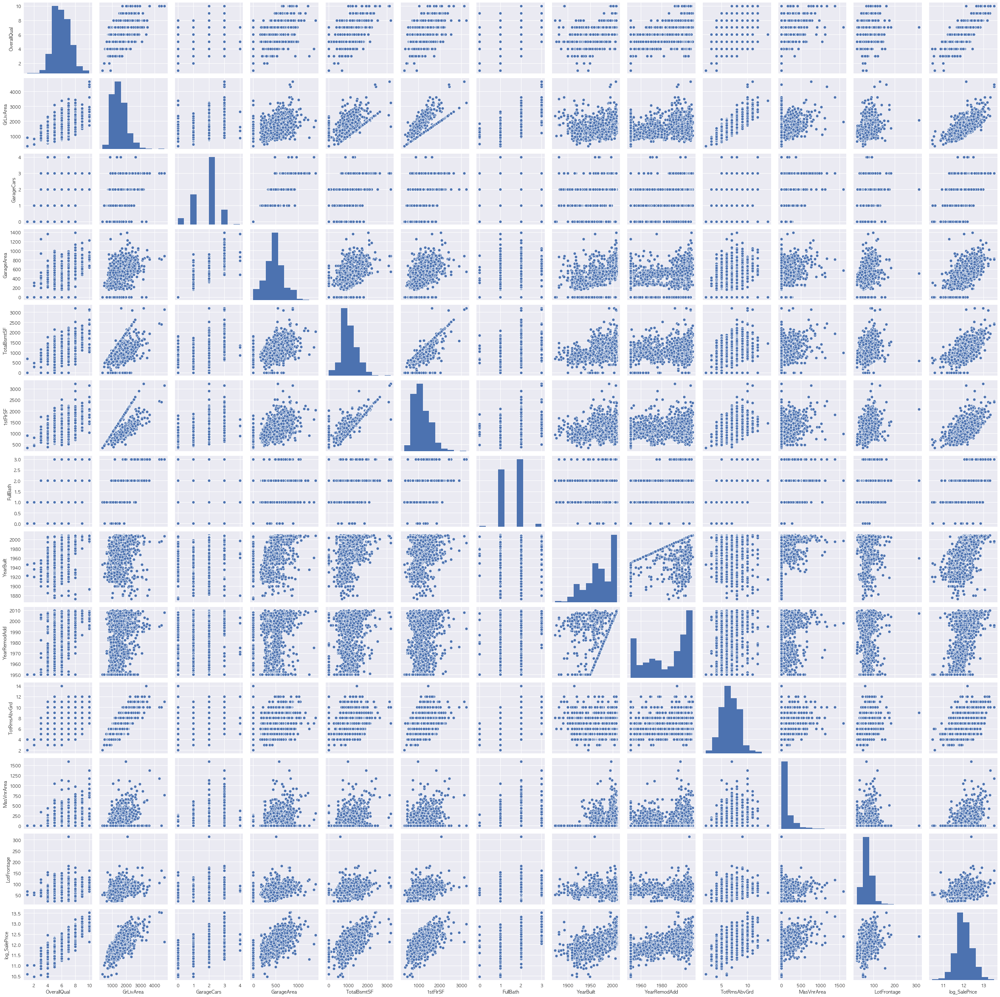

In [80]:
sns.pairplot(ames2)

* 이제 대부분의 변수들이 선형성을 만족하고 있음을 볼 수 있지만, LotFrontage 변수의 경우 하나의 점이 여전히 튀고 있음을 볼 수 있습니다. 
* 또한 GrLivArea의 경우에도 하나의 점이 이상한 경향을 보이고 있음을 볼 수 있습니다. 
* 이 점을 제거해 주고 분석에 이용하도록 하겠습니다. 

In [99]:
ames2 = ames2.drop([523, 934], axis=0)
ames2.shape

(1457, 21)

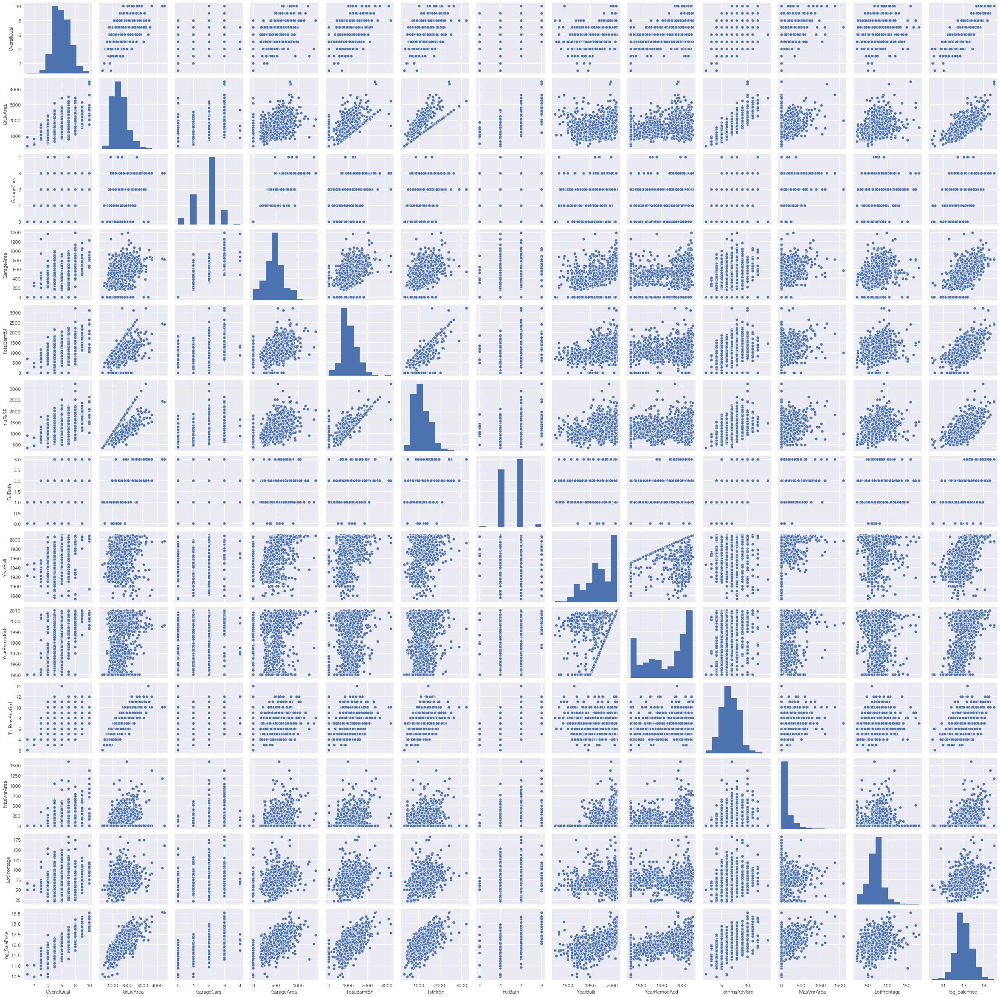

In [100]:
sns.pairplot(ames2)

* 대부분의 변수들이 회귀분석에 적합한 형태를 보이고 있음을 알 수 있습니다. 

## 3. VIF check 
* 선형회귀분석의 경우, 변수들 사이에 선형 관계가 존재하면 다중공선성 문제가 발생할 수 있습니다. 
* VIF를 체크하여 이러한 문제점을 해결해 보았습니다. 
* 1stFlrSF 변수의 경우 몇몇 변수들과 선형 관계를 보이기 때문에, 제거하는 방향으로 분석하였습니다. 

In [107]:
numerical_features = ames2[['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', 
                          '1stFlrSF', 'FullBath', 'YearBuilt', 'YearRemodAdd',  
                          'TotRmsAbvGrd', 'MasVnrArea', 'LotFrontage']]

In [108]:
# VIF check 
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(numerical_features.values, i) for i in range(numerical_features.shape[1])]
vif["features"] = numerical_features.columns
vif.sort_values(["VIF Factor"], ascending=[False])

,VIF Factor,features
7,8391.409520,YearBuilt
8,8258.974264,YearRemodAdd
9,58.341469,TotRmsAbvGrd
1,49.762043,GrLivArea
0,49.629429,OverallQual
5,37.564002,1stFlrSF
2,35.037631,GarageCars
3,29.812870,GarageArea
4,25.571183,TotalBsmtSF
6,18.157856,FullBath


* Year과 관련된 변수들의 다중공선성 값이 굉장히 크게 나오므로, 제거하겠습니다. 

In [109]:
numerical_features = numerical_features.drop(["YearBuilt"], axis=1)

In [110]:
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(numerical_features.values, i) for i in range(numerical_features.shape[1])]
vif["features"] = numerical_features.columns
vif.sort_values(["VIF Factor"], ascending=[False])

,VIF Factor,features
8,58.265780,TotRmsAbvGrd
0,49.349838,OverallQual
1,47.934699,GrLivArea
7,43.042416,YearRemodAdd
5,37.498371,1stFlrSF
2,34.622426,GarageCars
3,29.812803,GarageArea
4,25.292527,TotalBsmtSF
6,17.401190,FullBath
10,16.048091,LotFrontage


In [111]:
numerical_features = numerical_features.drop(["TotRmsAbvGrd"], axis=1)

In [112]:
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(numerical_features.values, i) for i in range(numerical_features.shape[1])]
vif["features"] = numerical_features.columns
vif.sort_values(["VIF Factor"], ascending=[False])

,VIF Factor,features
0,48.708048,OverallQual
5,37.495805,1stFlrSF
2,34.549165,GarageCars
7,33.177046,YearRemodAdd
3,29.686869,GarageArea
4,25.204974,TotalBsmtSF
1,23.614563,GrLivArea
6,17.244585,FullBath
9,15.864471,LotFrontage
8,1.694568,MasVnrArea


In [113]:
numerical_features = numerical_features.drop(["1stFlrSF"], axis=1)

In [114]:
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(numerical_features.values, i) for i in range(numerical_features.shape[1])]
vif["features"] = numerical_features.columns
vif.sort_values(["VIF Factor"], ascending=[False])

,VIF Factor,features
0,47.599283,OverallQual
2,34.543060,GarageCars
6,31.389081,YearRemodAdd
3,29.556196,GarageArea
1,21.382977,GrLivArea
5,17.236723,FullBath
8,15.708817,LotFrontage
4,11.917864,TotalBsmtSF
7,1.694394,MasVnrArea


* OverallQual 변수의 경우, 집값 형성에 굉장히 중요한 변수라고 파악되기 때문에 제거하지 않았습니다. 
* 또한 다중공선성의 기준은 vif>20 이지만, 남은 변수들은 꽤 중요한 변수라고 파악되기 때문에 제거하지 않고, 추후에 고려하는 방식으로 분석하였습니다. 

## 4. One-hot Encoding 
* 범주형 변수의 경우 dummy variable 로 바꾸어 주는 과정이 필요합니다. 

In [158]:
categorical_features = ames2[['HouseStyle', 'RoofStyle', 'Exterior1st', 'Foundation', 'BsmtQual', 'GarageType', 'KitchenQual', 'Neighborhood']]

In [160]:
categorical_features = pd.get_dummies(categorical_features, drop_first=True)

In [162]:
categorical_features.shape

(1457, 68)

## 5. Final DataSet 

In [163]:
X = pd.concat([numerical_features, categorical_features], axis=1)
y = ames2.log_SalePrice

In [164]:
X.shape, y.shape 

((1457, 77), (1457,))

# Modeling 

In [165]:
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, Lasso

from sklearn.metrics import mean_squared_error # False = RMSE 
from sklearn.metrics import mean_absolute_error # MAE 

In [223]:
import scipy.stats

## 1. Basic Linear Regression Model 

In [166]:
# train test split 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [167]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [171]:
# fit된 모델의 R-square
lr.score(X_train, y_train)

0.8955552691383967

In [238]:
# predict
pred = lr.predict(X_test)

In [174]:
# test data R-square
lr.score(X_test, y_test)

0.8853039882699684

In [239]:
# RMSE 
mean_squared_error(y_test, pred, squared=False)

0.14010779912713398

In [240]:
# MAE 
mean_absolute_error(y_test, pred)

0.1014735466001695

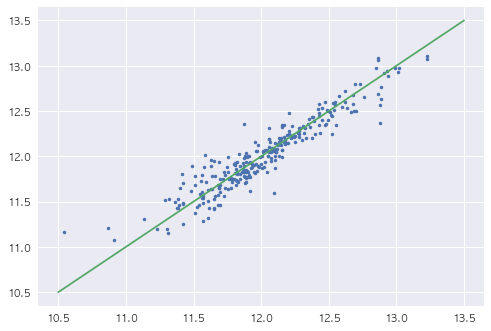

In [178]:
# 예측 vs 실제 데이터 plot
plt.plot(y_test, lr.predict(X_test), '.')

# 예측과 실제가 비슷하면, 라인상에 분포합니다.
xline = np.linspace(10.5, 13.5, 100)
yline = xline
plt.plot(xline, yline)
plt.show()

* 추정된 회귀식의 R-squared 값도 0.89 정도로 매우 괜찮고, 예측값과 실제값이 비슷한 형상을 보이므로 괜찮은 회귀식을 찾았다고 생각할 수 있습니다. 
* 이 회귀식의 RMSE 값은 0.1279 이고, MAE 값은 0.0931 입니다. 

### 회귀분석 가정 검토 

In [224]:
# 잔차 = 실제값 - 예측값 
residual = y_test - lr.predict(X_test)

In [225]:
sr = scipy.stats.zscore(residual)
(res_x, res_y), _ = scipy.stats.probplot(sr)

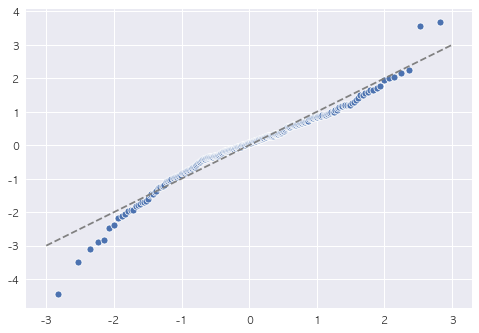

In [226]:
# 잔차의 정규성 
sns.scatterplot(res_x, res_y)
plt.plot([-3, 3], [-3, 3], '--', color='grey')

* 왼쪽 아래에서 직선의 형태를 벗어나긴 하지만, 대부분의 점들이 직선의 형태를 따르고 있으므로, 정규성을 만족한다고 할 수 있습니다. 

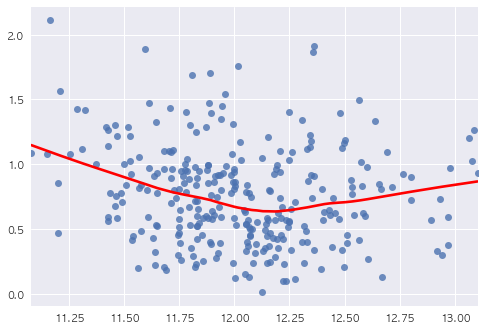

In [227]:
# 잔차의 등분산성 
sns.regplot(lr.predict(X_test), np.sqrt(np.abs(sr)), lowess=True, line_kws={'color': 'red'})

* 등분산성은 살짝 만족하지 않는 것으로 보입니다. 

## 2. Backward Elimination Model

* train/test split 을 진행하지 않고, 전체 dataset으로 모델을 적용했을 때의 양상입니다. 
* p-value 값이 꽤 큰 변수들이 보이므로, backward 과정을 거쳐 변수를 선택해 보겠습니다. 

In [179]:
import statsmodels.api as sm

In [180]:
model = sm.OLS(y, X)
result = model.fit()
print(result.summary())

                                 OLS Regression Results                                
Dep. Variable:          log_SalePrice   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.402e+05
Date:                Mon, 19 Oct 2020   Prob (F-statistic):                        0.00
Time:                        02:45:15   Log-Likelihood:                          839.34
No. Observations:                1457   AIC:                                     -1525.
Df Residuals:                    1380   BIC:                                     -1118.
Df Model:                          77                                                  
Covariance Type:            nonrobust                                                  
                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------

In [201]:
X2 = X.drop(list(X.columns[X.columns.str.contains("RoofStyle")]), axis=1)

In [202]:
model2 = sm.OLS(y, X2)
result2 = model2.fit()
print(result2.summary())

                                 OLS Regression Results                                
Dep. Variable:          log_SalePrice   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.502e+05
Date:                Mon, 19 Oct 2020   Prob (F-statistic):                        0.00
Time:                        03:02:26   Log-Likelihood:                          838.03
No. Observations:                1457   AIC:                                     -1532.
Df Residuals:                    1385   BIC:                                     -1152.
Df Model:                          72                                                  
Covariance Type:            nonrobust                                                  
                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------

In [203]:
X3 = X2.drop(list(X2.columns[X2.columns.str.contains("HouseStyle")]), axis=1)

In [204]:
model3 = sm.OLS(y, X3)
result3 = model3.fit()
print(result3.summary())

                                 OLS Regression Results                                
Dep. Variable:          log_SalePrice   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.653e+05
Date:                Mon, 19 Oct 2020   Prob (F-statistic):                        0.00
Time:                        03:02:31   Log-Likelihood:                          829.64
No. Observations:                1457   AIC:                                     -1529.
Df Residuals:                    1392   BIC:                                     -1186.
Df Model:                          65                                                  
Covariance Type:            nonrobust                                                  
                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------

In [205]:
X4 = X3.drop(list(X3.columns[X3.columns.str.contains("Exterior1st")]), axis=1)

In [206]:
model4 = sm.OLS(y, X4)
result4 = model4.fit()
print(result4.summary())

                                 OLS Regression Results                                
Dep. Variable:          log_SalePrice   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          2.045e+05
Date:                Mon, 19 Oct 2020   Prob (F-statistic):                        0.00
Time:                        03:02:51   Log-Likelihood:                          800.72
No. Observations:                1457   AIC:                                     -1499.
Df Residuals:                    1406   BIC:                                     -1230.
Df Model:                          51                                                  
Covariance Type:            nonrobust                                                  
                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------

In [207]:
X5 = X4.drop(list(X4.columns[X4.columns.str.contains("GarageType")]), axis=1)

In [208]:
model5 = sm.OLS(y, X5)
result5 = model5.fit()
print(result5.summary())

                                 OLS Regression Results                                
Dep. Variable:          log_SalePrice   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          2.242e+05
Date:                Mon, 19 Oct 2020   Prob (F-statistic):                        0.00
Time:                        03:03:53   Log-Likelihood:                          773.36
No. Observations:                1457   AIC:                                     -1457.
Df Residuals:                    1412   BIC:                                     -1219.
Df Model:                          45                                                  
Covariance Type:            nonrobust                                                  
                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------

In [209]:
X6 = X5.drop(list(X5.columns[X5.columns.str.contains("Neighborhood")]), axis=1)

In [210]:
model6 = sm.OLS(y, X6)
result6 = model6.fit()
print(result6.summary())

                                 OLS Regression Results                                
Dep. Variable:          log_SalePrice   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          4.130e+05
Date:                Mon, 19 Oct 2020   Prob (F-statistic):                        0.00
Time:                        03:05:09   Log-Likelihood:                          650.97
No. Observations:                1457   AIC:                                     -1260.
Df Residuals:                    1436   BIC:                                     -1149.
Df Model:                          21                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------

In [211]:
X7 = X6.drop(list(X6.columns[X6.columns.str.contains("BsmtQual")]), axis=1)

In [213]:
model7 = sm.OLS(y, X7)
result7 = model7.fit()
print(result7.summary())

                                 OLS Regression Results                                
Dep. Variable:          log_SalePrice   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          5.081e+05
Date:                Mon, 19 Oct 2020   Prob (F-statistic):                        0.00
Time:                        03:06:09   Log-Likelihood:                          645.96
No. Observations:                1457   AIC:                                     -1258.
Df Residuals:                    1440   BIC:                                     -1168.
Df Model:                          17                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------

In [214]:
X8 = X7.drop(list(X7.columns[X7.columns.str.contains("Foundation")]), axis=1)

In [215]:
model8 = sm.OLS(y, X8)
result8 = model8.fit()
print(result8.summary())

                                 OLS Regression Results                                
Dep. Variable:          log_SalePrice   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          7.012e+05
Date:                Mon, 19 Oct 2020   Prob (F-statistic):                        0.00
Time:                        03:07:54   Log-Likelihood:                          624.33
No. Observations:                1457   AIC:                                     -1225.
Df Residuals:                    1445   BIC:                                     -1161.
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

* p-value 값이 큰 순서대로 차례대로 빼 본 결과, 9개의 연속형 변수와 1개의 범주형 변수가 남았습니다.
* 해당 모델이 괜찮은 설명력을 가지는지 살펴보았습니다. 

In [216]:
# train test split 
X_train2, X_test2, y_train2, y_test2 = train_test_split(X8, y, test_size=0.2, random_state=0)

In [217]:
lr2 = LinearRegression()
lr2.fit(X_train2, y_train2)

In [218]:
# fit된 모델의 R-square
lr2.score(X_train2, y_train2)

0.8492814880907159

In [241]:
# predict
pred2 = lr2.predict(X_test2)

In [221]:
# test data R-square
lr2.score(X_test2, y_test2)

0.8710277925621919

In [242]:
# RMSE 
mean_squared_error(y_test2, pred2, squared=False)

0.14857174329948364

In [243]:
# MAE 
mean_absolute_error(y_test2, pred2)

0.10873060139319528

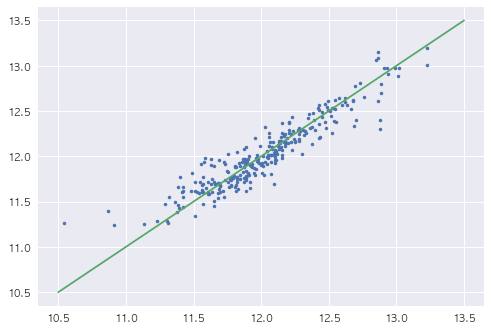

In [222]:
# 예측 vs 실제 데이터 plot
plt.plot(y_test2, lr2.predict(X_test2), '.')

# 예측과 실제가 비슷하면, 라인상에 분포합니다.
xline = np.linspace(10.5, 13.5, 100)
yline = xline
plt.plot(xline, yline)
plt.show()

* 기본 모델보다는 R-squared 및 RMSE, MAE 값이 더 좋지 못하게 나타납니다. 

### 회귀분석 가정 검토 

In [228]:
# 잔차 = 실제값 - 예측값 
residual2 = y_test2 - lr2.predict(X_test2)

sr2 = scipy.stats.zscore(residual2)
(res_x2, res_y2), _ = scipy.stats.probplot(sr2)

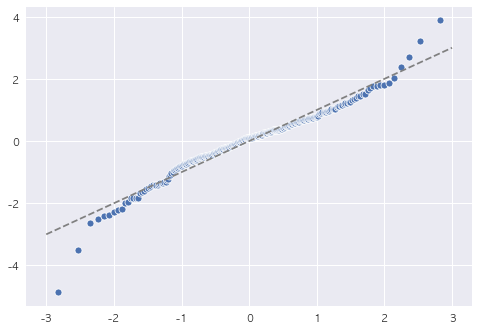

In [229]:
# 잔차의 정규성 
sns.scatterplot(res_x2, res_y2)
plt.plot([-3, 3], [-3, 3], '--', color='grey')

* 직선의 형태를 잘 따르고 있으므로, 잔차가 정규성을 만족한다고 할 수 있습니다. 

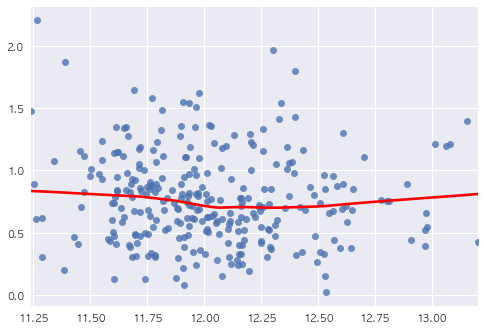

In [230]:
# 잔차의 등분산성 
sns.regplot(lr2.predict(X_test2), np.sqrt(np.abs(sr2)), lowess=True, line_kws={'color': 'red'})

* 빨간색 선이 직선의 형태를 보이므로, 등분산성을 잘 만족하고 있다고 생각할 수 있습니다. 

## 3. Ridge Regression Model
* Ridge/Lasso Regression은 **Regularization** 방법입니다. 
    * 선형회귀분석에서는 LSE(Least Squared Error)를 최소화 하는 방향으로 최적 회귀식을 찾고, unbiased estimator를 찾습니다. 
    * Regularization 방법에서는, 기존 Loss 식 뒤에 회귀계수 크기에 대한 penalty를 부여하여, overfitting을 피하게끔 도와줍니다. 
    * 따라서 biased 하지만, smaller variance 를 갖는 estimator를 추정하게 됩니다. 
    
    
* Ridge Regression에서는 모든 변수의 계수의 값을 줄이는 방향으로, 
* Lasso Regression에서는 중요한 몇 개 변수만 제외하고, 나머지 변수들의 계수들을 0으로 줄이는 방향으로 학습하게 됩니다. 

In [231]:
ridge = Ridge(alpha=0.05) # alpha = hyperparameter
ridge.fit(X_train, y_train)
ridge.score(X_train, y_train) 

0.8955512716854345

In [244]:
# predict
pred3 = ridge.predict(X_test)

In [234]:
# test data R-square
ridge.score(X_test, y_test)

0.8856278874245778

In [245]:
# RMSE 
mean_squared_error(y_test, pred3, squared=False)

0.13990982850491188

In [246]:
# MAE 
mean_absolute_error(y_test, pred3)

0.10135277315243776

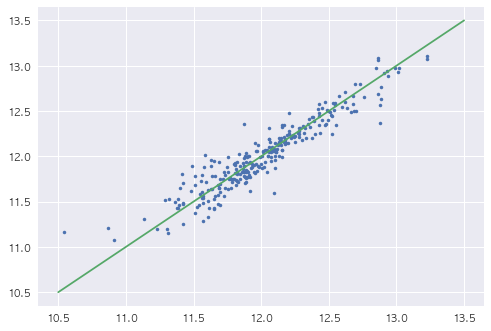

In [237]:
# 예측 vs 실제 데이터 plot
plt.plot(y_test, ridge.predict(X_test), '.')

# 예측과 실제가 비슷하면, 라인상에 분포합니다.
xline = np.linspace(10.5, 13.5, 100)
yline = xline
plt.plot(xline, yline)
plt.show()

### 회귀분석 가정 검토 

In [247]:
# 잔차 = 실제값 - 예측값 
residual3 = y_test - ridge.predict(X_test)

sr3 = scipy.stats.zscore(residual3)
(res_x3, res_y3), _ = scipy.stats.probplot(sr3)

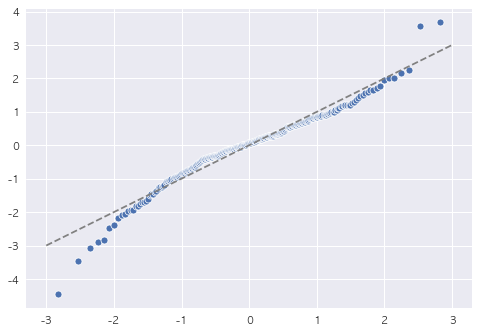

In [248]:
# 잔차의 정규성 
sns.scatterplot(res_x3, res_y3)
plt.plot([-3, 3], [-3, 3], '--', color='grey')

* 잔차가 정규성을 따르고 있습니다. 

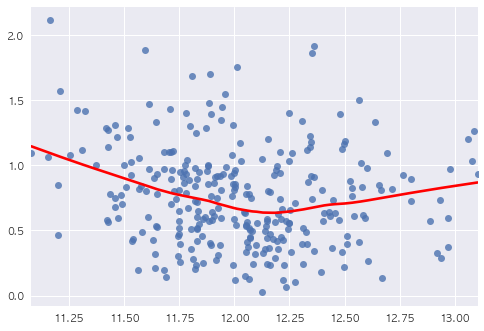

In [249]:
# 잔차의 등분산성 
sns.regplot(pred3, np.sqrt(np.abs(sr3)), lowess=True, line_kws={'color': 'red'})

* 등분산성 가정을 완벽하게 만족시키지는 못하고 있습니다. 

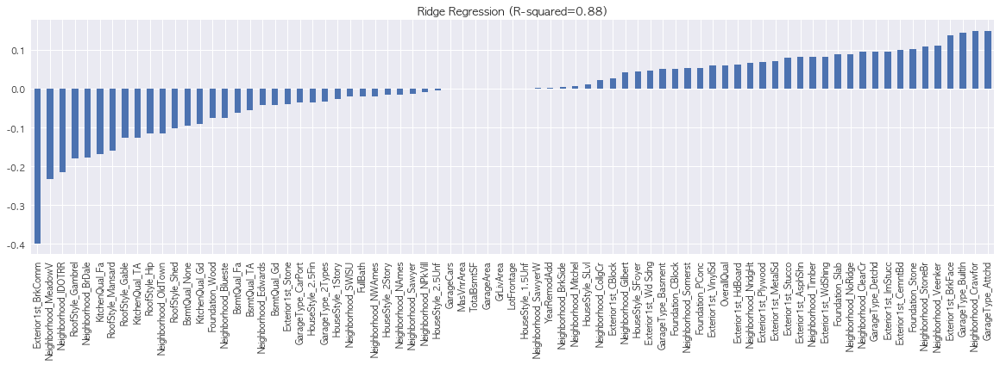

In [251]:
plt.figure(figsize=(20, 5))
coef_ridge = pd.Series(ridge.coef_, X_train.columns).sort_values()
coef_ridge.plot(kind='bar')
plt.title('Ridge Regression (R-squared=0.88)', fontsize=13)
plt.show()

## 4. Lasso Regression Model 

In [264]:
lasso = Lasso(alpha=0.001) # alpha = hyperparameter
lasso.fit(X_train, y_train)
lasso.score(X_train, y_train) 

0.8815814113277012

In [265]:
# predict
pred4 = lasso.predict(X_test)

In [266]:
# test data R-square
lasso.score(X_test, y_test)

0.8888935706414623

In [267]:
# RMSE 
mean_squared_error(y_test, pred4, squared=False)

0.13789793036646456

In [268]:
# MAE 
mean_absolute_error(y_test, pred4)

0.10252337921026719

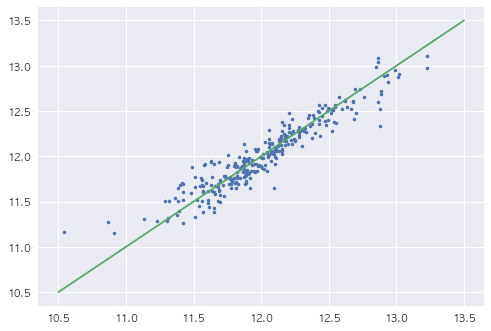

In [269]:
# 예측 vs 실제 데이터 plot
plt.plot(y_test, lasso.predict(X_test), '.')

# 예측과 실제가 비슷하면, 라인상에 분포합니다.
xline = np.linspace(10.5, 13.5, 100)
yline = xline
plt.plot(xline, yline)
plt.show()

### 회귀분석 가정 검토 

In [270]:
# 잔차 = 실제값 - 예측값 
residual4 = y_test - lasso.predict(X_test)

sr4 = scipy.stats.zscore(residual4)
(res_x4, res_y4), _ = scipy.stats.probplot(sr4)

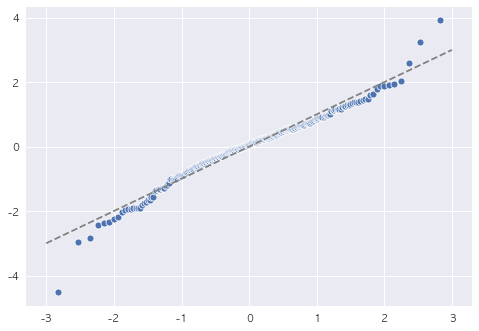

In [271]:
# 잔차의 정규성 
sns.scatterplot(res_x4, res_y4)
plt.plot([-3, 3], [-3, 3], '--', color='grey')

* 잔차가 정규성을 따르고 있습니다. 

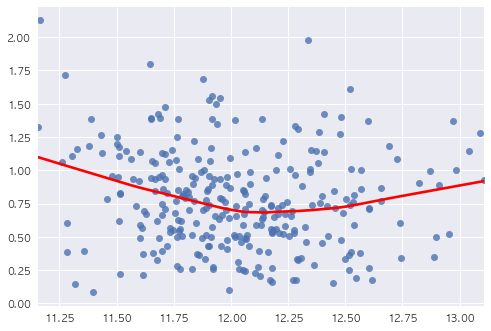

In [272]:
# 잔차의 등분산성 
sns.regplot(pred4, np.sqrt(np.abs(sr4)), lowess=True, line_kws={'color': 'red'})

* 등분산성을 살짝 만족하지 못하고 있습니다.  

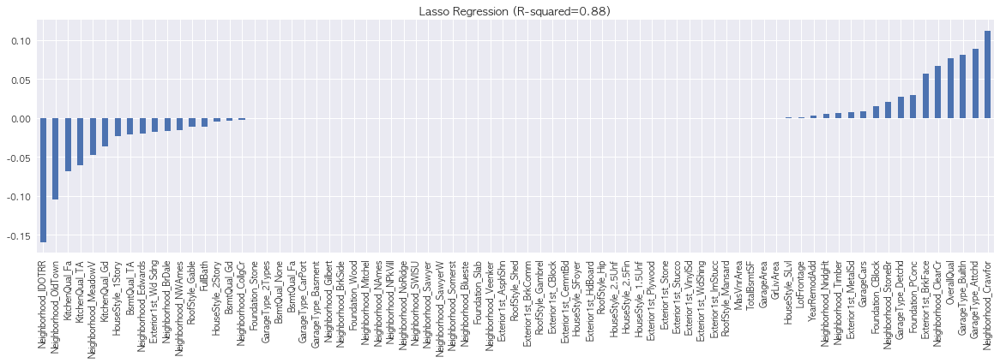

In [274]:
plt.figure(figsize=(20, 5))
coef_lasso = pd.Series(lasso.coef_, X_train.columns).sort_values()
coef_lasso.plot(kind='bar')
plt.title('Lasso Regression (R-squared=0.88)', fontsize=13)
plt.show()

* 많은 범주형 변수들을 선택하지 않았음을 알 수 있습니다. 

# Conclusion 


| no. | Model | R-squared | RMSE | MAE | 정규성 | 등분산성 |
|: --- :|: --- |: --- :| : ---: | :---:|:---:|:---:|
| 1 | Simple Linear Regression  | 0.8853 | 0.1401 | 0.1015 | 만족 | 살짝 불만족 | 
| 2 | Backward Elimination  | 0.8710 | 0.1485 | 0.1087 | 만족 | 만족 | 
| 3 | Ridge Regression  | 0.8856 | 0.1399 | 0.1013 | 만족 | 살짝 불만족 | 
| 4 | Lasso Regression  | 0.8888 | 0.1378 | 0.1025 | 만족 | 살짝 불만족 | 

* 모델들의 R-squared 값은 0.87~0.88 정도로 모두 비슷합니다. 
* RMSE 값은 Regularization 과정을 거친 Ridge, Lasso Regression 의 값이 작은 편입니다. 
* MAE 값은 모두 비슷합니다. 
* 회귀분석 가정을 체크해 본 결과, p-value 를 기준으로 backward elimination을 한 모델이 기본 가정을 가장 잘 만족하고 있음을 볼 수 있습니다. 



* 성능 지표 향상을 위한 모델로는, Lasso Regression을 적용한 4번째 모델을 선정하였습니다. 
* 가장 높은 R-squared 값을 가지고 있고, RMSE 값과 MAE 값이 가장 좋게 나타나고 있기 때문입니다. 
* 또한 적당한 수의 설명변수를 가지고 있기 때문에, 모형의 간결성 확보 측면에서도 좋을 것이라 여겨져서 선택하였습니다. 



* 그렇지만 회귀모델 설명력 측면에서는, 2번째 모델을 선정할 것 같습니다. 
* R-squared 값은 가장 낮게 나타나지만, 0.87도 상당히 큰 수치이므로 모델의 설명력은 괜찮을 것이라 여겨집니다. 
* 무엇보다도 회귀분석의 기본가정인 정규성, 등분산성을 가장 잘 만족하고 있기 때문에, 해당 모델이 괜찮다고 생각됩니다. 